# Predicting Tornado Injuries

## Import Statements

In [84]:
import pandas as pd                  # Pandas
from matplotlib import pyplot as plt # Matplotlib

# Package to implement ML Models
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor # Decision Tree
from xgboost import XGBRegressor, XGBClassifier  # XG Boost

# Package for data partitioning
from sklearn.model_selection import train_test_split

# Import packages to implement Stratified K-fold CV
from sklearn.model_selection import StratifiedKFold # For creating folds

# Import Package to implement GridSearch CV (Hyperparameter Tuning Method 1)
from sklearn.model_selection import GridSearchCV

# Importing package for Randomized Search CV (Hyperparameter Tuning Method 2)
from sklearn.model_selection import RandomizedSearchCV

# Package for generating confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Package for generating classification report
from sklearn.metrics import classification_report

# Time packages
import time

# Module to save and load Python objects to and from files
import pickle

# Ignore Deprecation Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=FutureWarning) 

%matplotlib inline

## Importing Data

In [2]:
# Import Data from years 2018, 2021, 2022, 2023

storm_locations_2023_df = pd.read_csv('StormEvents_locations-ftp_v1.0_d2023_c20231017.csv')
storm_locations_2023_df.head()
storm_details_2023_df = pd.read_csv('StormEvents_details-ftp_v1.0_d2023_c20231017.csv')
storm_details_2023_df.head()

storm_2023_df = storm_locations_2023_df.merge(storm_details_2023_df, how="left", left_on='EVENT_ID', right_on='EVENT_ID')

storm_details_2022_df = pd.read_csv('StormEvents_details-ftp_v1.0_d2022_c20231116.csv')
storm_locations_2022_df = pd.read_csv('StormEvents_locations-ftp_v1.0_d2022_c20231116.csv')
storm_2022_df = storm_locations_2022_df.merge(storm_details_2022_df, how="left", left_on='EVENT_ID', right_on='EVENT_ID')

storm_locations_2021_df = pd.read_csv('StormEvents_locations-ftp_v1.0_d2021_c20231017.csv')
storm_details_2021_df = pd.read_csv('StormEvents_details-ftp_v1.0_d2021_c20231017.csv')
storm_2021_df = storm_locations_2021_df.merge(storm_details_2021_df, how="left", left_on='EVENT_ID', right_on='EVENT_ID')

storm_locations_2018_df = pd.read_csv('StormEvents_locations-ftp_v1.0_d2018_c20230616.csv')
storm_details_2018_df = pd.read_csv('StormEvents_details-ftp_v1.0_d2018_c20230616.csv')
storm_2018_df = storm_locations_2018_df.merge(storm_details_2018_df, how="left", left_on='EVENT_ID', right_on='EVENT_ID')

In [3]:
# subset to tornados only
tornado_2023_df = storm_2023_df[storm_2023_df["EVENT_TYPE"] == "Tornado"]
tornado_2023_df = tornado_2023_df.drop_duplicates(subset=['EVENT_ID'])

tornado_2022_df = storm_2022_df[storm_2022_df["EVENT_TYPE"] == "Tornado"]
tornado_2022_df = tornado_2022_df.drop_duplicates(subset=['EVENT_ID'])

tornado_2021_df = storm_2021_df[storm_2021_df["EVENT_TYPE"] == "Tornado"]
tornado_2021_df = tornado_2021_df.drop_duplicates(subset=['EVENT_ID'])

tornado_2018_df = storm_2018_df[storm_2018_df["EVENT_TYPE"] == "Tornado"]
tornado_2018_df = tornado_2018_df.drop_duplicates(subset=['EVENT_ID'])



In [4]:
# Add all datsets together
tornado_df = pd.concat([tornado_2023_df, tornado_2022_df, tornado_2021_df, tornado_2018_df])

tornado_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3981 entries, 90 to 73433
Data columns (total 61 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   YEARMONTH           3981 non-null   int64  
 1   EPISODE_ID_x        3981 non-null   int64  
 2   EVENT_ID            3981 non-null   int64  
 3   LOCATION_INDEX      3981 non-null   int64  
 4   RANGE               3981 non-null   float64
 5   AZIMUTH             3981 non-null   object 
 6   LOCATION            3981 non-null   object 
 7   LATITUDE            3981 non-null   float64
 8   LONGITUDE           3981 non-null   float64
 9   LAT2                3981 non-null   int64  
 10  LON2                3981 non-null   int64  
 11  BEGIN_YEARMONTH     3981 non-null   float64
 12  BEGIN_DAY           3981 non-null   float64
 13  BEGIN_TIME          3981 non-null   float64
 14  END_YEARMONTH       3981 non-null   float64
 15  END_DAY             3981 non-null   float64
 16  END_TIME 

## Data Cleaning

In [33]:
# Convert date_time column to datetime object
tornado_df['BEGIN_DATE_TIME'] = tornado_df['BEGIN_DATE_TIME'].apply(pd.to_datetime)
tornado_df['END_DATE_TIME'] = tornado_df['END_DATE_TIME'].apply(pd.to_datetime)
tornado_df['TIME_ELAPSED'] = (tornado_df['END_DATE_TIME'] - tornado_df['BEGIN_DATE_TIME']).dt.total_seconds() / 60

# convert time delta to minutes
# tornado_df['TIME_ELAPSED'] = tornado_df['TIME_ELAPSED'].astype('timedelta64[s]')

# find range of tornado from lat & lon
tornado_df['VERTICAL_MOVEMENT'] = abs(tornado_df['BEGIN_LAT'] - tornado_df['END_LAT'])
tornado_df['HORIZONTAL_MOVEMENT'] = abs(tornado_df['BEGIN_LON'] - tornado_df['END_LON'])


In [34]:
tornado_df['TIME_ELAPSED'].head()

90      2.0
92     14.0
94      2.0
109     1.0
198     7.0
Name: TIME_ELAPSED, dtype: float64

In [35]:
# change property and crop damage column from string to numeric
def convert_to_numeric(value):
  value = str(value).lower()
  if 'k' in value:
      return float(value.replace('k', '')) * 1000
  elif 'm' in value:
      return float(value.replace('m', '')) * 1000000
  else:
      return float(value)

# Apply the conversion function to the column
tornado_df['DAMAGE_PROPERTY'] = tornado_df['DAMAGE_PROPERTY'].apply(convert_to_numeric)
tornado_df['DAMAGE_CROPS'] = tornado_df['DAMAGE_CROPS'].apply(convert_to_numeric)


In [36]:
# Making injuries into a classifier
tornado_df['INJURIES_BINARY'] = tornado_df.apply(lambda x: 'Injuries' if x['INJURIES_DIRECT'] > 0 else 'No Injuries', axis = 1)

tornado_df['INJURIES_CLASS'] = tornado_df['INJURIES_DIRECT'].apply(lambda x: 0 if x == 0 else (1 if 1 <= x <= 5 else 2))



In [37]:
tornado_df.shape

(3981, 66)

## Data Exploration

In [38]:
tornado_df['INJURIES_DIRECT'].value_counts()

INJURIES_DIRECT
0.0      3797
1.0        63
2.0        42
3.0        13
5.0        12
4.0        10
6.0         7
8.0         7
7.0         6
10.0        4
16.0        2
30.0        2
22.0        2
11.0        2
13.0        1
9.0         1
17.0        1
63.0        1
15.0        1
44.0        1
14.0        1
23.0        1
12.0        1
100.0       1
54.0        1
28.0        1
Name: count, dtype: int64

## Tornados Injuries Prediction

In [39]:
df_injuries = tornado_df[['BEGIN_DAY', 'BEGIN_TIME', 'STATE',  'YEAR',
       'MONTH_NAME', 'CZ_TYPE', 'CZ_NAME', 'WFO',
       'INJURIES_CLASS',
  #   'DAMAGE_PROPERTY', 'DAMAGE_CROPS',
       'SOURCE',
  #     'TOR_F_SCALE',
       'TOR_LENGTH', 'TOR_WIDTH',
       'BEGIN_LAT', 'BEGIN_LON', 'END_LAT', 'END_LON', 'TIME_ELAPSED',
       'VERTICAL_MOVEMENT', 'HORIZONTAL_MOVEMENT']]


# drop NA values
df_injuries.dropna(inplace=True)

df_injuries.shape

(3981, 19)

In [40]:
df_injuries['INJURIES_CLASS'].value_counts()

INJURIES_CLASS
0    3797
1     140
2      44
Name: count, dtype: int64

In [85]:
df_injuries.to_csv('tornado.csv')

In [41]:
# set target variable
X = df_injuries.drop(columns = ['INJURIES_CLASS'])
y = df_injuries['INJURIES_CLASS']

# encode categorical variables
cat_var = ['STATE', 'MONTH_NAME', 'CZ_TYPE', 'CZ_NAME', 'WFO','SOURCE']#, 'TOR_F_SCALE']
X_encoded = pd.get_dummies(X, columns = cat_var)

# split train/test dataset
train_X, test_X, train_y, test_y = train_test_split(X_encoded, y, test_size = 0.3, random_state = 1)

# Creating folds
folds = StratifiedKFold(n_splits = 3, shuffle = True, random_state = 100)

In [42]:
# set class name
uniques = pd.Index(['No Injuries', 'A Few Injuries', 'Many Injuries'])

### XGBoost: Stratified K-fold CV w/ Tuning

In [43]:
# Define model algorithm
XGClassifier = XGBClassifier(random_state = 42)

##### Tuning n estimators, min child weight, max depth

In [44]:
random_grid = {
    'max_depth': list(range(2,30,2)),
    'min_child_weight':list(range(1,60, 2)),
    'n_estimators': list(range(2, 30, 2))
}

print(random_grid)

xg_model_cv = RandomizedSearchCV(estimator = XGClassifier,
                                param_distributions = random_grid,
                                n_iter = 40,
                                scoring='f1_weighted',
                                n_jobs=4,
                                cv=folds,
                                random_state = 42)

{'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28], 'min_child_weight': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59], 'n_estimators': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28]}


In [45]:
# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) 

/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:332: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype)
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:323: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return is_int o

Training time: 81.67567682266235s
Initial score:  0.9334402139904934
Initial parameters:  {'n_estimators': 22, 'min_child_weight': 5, 'max_depth': 14}


In [46]:
param_grid = {
    'max_depth': list(range(24, 28)),
    'min_child_weight':list(range(1, 4)),
    'n_estimators': list(range(22, 26))
}

print(param_grid)

xg_model_cv = GridSearchCV(estimator = XGClassifier,
                                param_grid = param_grid,
                                scoring='f1_weighted',
                                n_jobs=4,
                                cv=folds,
                                verbose = 1)

{'max_depth': [24, 25, 26, 27], 'min_child_weight': [1, 2, 3], 'n_estimators': [22, 23, 24, 25]}


In [47]:
# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

Fitting 3 folds for each of 48 candidates, totalling 144 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) 

Training time: 249.99973583221436s
Initial score:  0.9340909692590046
Initial parameters:  {'max_depth': 24, 'min_child_weight': 3, 'n_estimators': 25}


##### Tuning gamma and learning rate

In [48]:
random_grid = {
    'max_depth': list(range(22, 28)),
    'min_child_weight':list(range(1, 5)),
    'n_estimators': list(range(20, 26)),
    'gamma': list(range(1,10)),
    'learning_rate': [i/10.0 for i in range(1,11)]
}

print(random_grid)

xg_model_cv = RandomizedSearchCV(estimator = XGClassifier,
                                param_distributions = random_grid,
                                n_iter = 50,
                                scoring='f1_weighted',
                                n_jobs=-1,
                                cv=folds,
                                random_state = 42)

{'max_depth': [22, 23, 24, 25, 26, 27], 'min_child_weight': [1, 2, 3, 4], 'n_estimators': [20, 21, 22, 23, 24, 25], 'gamma': [1, 2, 3, 4, 5, 6, 7, 8, 9], 'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}


In [49]:
# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) 

Training time: 200.01736307144165s
Initial score:  0.9337888838501104
Initial parameters:  {'n_estimators': 24, 'min_child_weight': 4, 'max_depth': 27, 'learning_rate': 0.9, 'gamma': 2}


In [50]:
pd.DataFrame(xg_model_cv.cv_results_).sort_values(by = 'rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_child_weight,param_max_depth,param_learning_rate,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
38,18.586610,0.780115,0.338504,0.048501,24,4,27,0.9,2,"{'n_estimators': 24, 'min_child_weight': 4, 'm...",0.936887,0.934056,0.930423,0.933789,0.002646,1
44,22.343447,0.911510,0.343371,0.098092,24,3,25,0.1,2,"{'n_estimators': 24, 'min_child_weight': 3, 'm...",0.935555,0.932529,0.932636,0.933573,0.001402,2
37,18.795594,0.666841,0.308882,0.009166,23,4,23,0.2,1,"{'n_estimators': 23, 'min_child_weight': 4, 'm...",0.934687,0.931936,0.933321,0.933315,0.001123,3
6,17.184154,0.649483,0.326272,0.018757,24,4,26,1.0,4,"{'n_estimators': 24, 'min_child_weight': 4, 'm...",0.936609,0.931345,0.930992,0.932982,0.002569,4
10,20.312040,0.421372,0.313343,0.008183,24,2,26,0.9,4,"{'n_estimators': 24, 'min_child_weight': 2, 'm...",0.935202,0.931936,0.931507,0.932881,0.001650,5


In [51]:
random_grid = {
    'max_depth': list(range(12, 25)),
    'min_child_weight':list(range(1, 5)),
    'n_estimators': list(range(12, 25)),
    'gamma': list(range(1,4)),
    'learning_rate': [round(0.5 + i/20.0,3) for i in range(1,11)]
}

print(random_grid)

xg_model_cv = RandomizedSearchCV(estimator = XGClassifier,
                                param_distributions = random_grid,
                                n_iter = 50,
                                scoring='f1_weighted',
                                n_jobs=4,
                                cv=folds,
                                random_state = 42)

{'max_depth': [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], 'min_child_weight': [1, 2, 3, 4], 'n_estimators': [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], 'gamma': [1, 2, 3], 'learning_rate': [0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]}


In [52]:
# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboo

Training time: 200.6316430568695s
Initial score:  0.9357759879747546
Initial parameters:  {'n_estimators': 13, 'min_child_weight': 3, 'max_depth': 22, 'learning_rate': 0.85, 'gamma': 2}


In [53]:
param_grid = {
    'max_depth': [12, 14, 16],
    'min_child_weight': [2, 3],
    'n_estimators': [16, 18, 20],
    'gamma': [1, 2, 3],
    'learning_rate': [0.9, 1]
}

print(param_grid)

xg_model_cv = GridSearchCV(estimator = XGClassifier,
                                param_grid = param_grid,
                                scoring='f1_weighted',
                                n_jobs=4,
                                cv=folds,
                                verbose = 1)

# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

{'max_depth': [12, 14, 16], 'min_child_weight': [2, 3], 'n_estimators': [16, 18, 20], 'gamma': [1, 2, 3], 'learning_rate': [0.9, 1]}
Fitting 3 folds for each of 108 candidates, totalling 324 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) 

Training time: 398.3502368927002s
Initial score:  0.9350424061875496
Initial parameters:  {'gamma': 1, 'learning_rate': 1, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 16}


In [54]:
param_grid = {
    'max_depth': [8, 10, 12],
    'min_child_weight': [3, 4],
    'n_estimators': [8, 10, 12, 16],
    'gamma': [1],
    'learning_rate': [1]
}

print(param_grid)

xg_model_cv = GridSearchCV(estimator = XGClassifier,
                                param_grid = param_grid,
                                scoring='f1_weighted',
                                n_jobs=4,
                                cv=folds,
                                verbose = 1)

# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

{'max_depth': [8, 10, 12], 'min_child_weight': [3, 4], 'n_estimators': [8, 10, 12, 16], 'gamma': [1], 'learning_rate': [1]}
Fitting 3 folds for each of 24 candidates, totalling 72 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:332: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype)
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:323: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return is_int o

Training time: 57.57449984550476s
Initial score:  0.9350424061875496
Initial parameters:  {'gamma': 1, 'learning_rate': 1, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 16}


##### Tune tree specific parameters

In [55]:
random_grid = {
    'max_depth': [7, 8, 9, 10, 11, 12],
    'min_child_weight': [2, 3],
    'n_estimators': [6, 7, 8, 9, 10],
    'gamma': [1],
    'learning_rate': [1],
    'subsample':[(0.5 + i/20.0) for i in range(1,11)],
    'colsample_bytree':[(0.5 + i/20.0) for i in range(1,11)]
}

print(random_grid)

xg_model_cv = RandomizedSearchCV(estimator = XGClassifier,
                                param_distributions = random_grid,
                                n_iter = 80,
                                scoring='f1_weighted',
                                n_jobs=-1,
                                cv=folds,
                                random_state = 42)

{'max_depth': [7, 8, 9, 10, 11, 12], 'min_child_weight': [2, 3], 'n_estimators': [6, 7, 8, 9, 10], 'gamma': [1], 'learning_rate': [1], 'subsample': [0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0], 'colsample_bytree': [0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]}


In [56]:
# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboo

Training time: 82.02689504623413s
Initial score:  0.9365068353780374
Initial parameters:  {'subsample': 0.65, 'n_estimators': 10, 'min_child_weight': 2, 'max_depth': 10, 'learning_rate': 1, 'gamma': 1, 'colsample_bytree': 0.85}


In [57]:
param_grid = {
    'max_depth': [8, 9, 10],
    'min_child_weight': [1, 2],
    'n_estimators': [8, 9, 10],
    'gamma': [1],
    'learning_rate': [1],
    'subsample': [0.7, 0.8, 0.95],
    'colsample_bytree': [0.725, 0.75, 0.775]
}
print(param_grid)

{'max_depth': [8, 9, 10], 'min_child_weight': [1, 2], 'n_estimators': [8, 9, 10], 'gamma': [1], 'learning_rate': [1], 'subsample': [0.7, 0.8, 0.95], 'colsample_bytree': [0.725, 0.75, 0.775]}


In [58]:

xg_model_cv = GridSearchCV(estimator = XGClassifier,
                            param_grid = param_grid,
                            scoring='f1_weighted',
                            cv=folds,
                            verbose = 1,
                            n_jobs=-1)

In [59]:
# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

Fitting 3 folds for each of 162 candidates, totalling 486 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/

Training time: 184.28183794021606s
Initial score:  0.9367409994487786
Initial parameters:  {'colsample_bytree': 0.725, 'gamma': 1, 'learning_rate': 1, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 9, 'subsample': 0.7}


In [60]:
param_grid = {
    'max_depth': [9],
    'min_child_weight': [2],
    'n_estimators': [7, 8, 9],
    'gamma': [1],
    'learning_rate': [1],
    'subsample': [0.92, 0.95, 0.98],
    'colsample_bytree': [0.74, 0.75, 0.76]
}
print(param_grid)


xg_model_cv = GridSearchCV(estimator = XGClassifier,
                            param_grid = param_grid,
                            scoring='f1_weighted',
                            cv=folds,
                            verbose = 1,
                            n_jobs=-1)

# Fit the model
start = time.time()            # Start Time
xg_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', xg_model_cv.best_score_)
print('Initial parameters: ', xg_model_cv.best_params_)

{'max_depth': [9], 'min_child_weight': [2], 'n_estimators': [7, 8, 9], 'gamma': [1], 'learning_rate': [1], 'subsample': [0.92, 0.95, 0.98], 'colsample_bytree': [0.74, 0.75, 0.76]}
Fitting 3 folds for each of 27 candidates, totalling 81 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:299: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/xgboost/data.py:301: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) 

Training time: 30.939292907714844s
Initial score:  0.9354867064896472
Initial parameters:  {'colsample_bytree': 0.75, 'gamma': 1, 'learning_rate': 1, 'max_depth': 9, 'min_child_weight': 2, 'n_estimators': 8, 'subsample': 0.92}


In [61]:
# Storing best model
bestXG = xg_model_cv.best_estimator_

### Decision Tree: Stratified K-fold CV w/ Tuning

In [62]:
# Define your model
DTClassifier = DecisionTreeClassifier(random_state = 42)

In [63]:
# Create the parameter grid based on the results of random search
random_grid = {
    'max_depth': list(range(2, 40, 4)),
    'min_samples_leaf': list(range(5, 70, 5)),
    'min_samples_split': list(range(5, 70, 5))
}

print(random_grid)

# Call RandomizedSearchCV()
dt_model_cv = RandomizedSearchCV(estimator = DTClassifier,
                              param_distributions = random_grid,
                              n_iter = 100,
                              scoring = 'f1_weighted',
                              cv = folds,
                              verbose = 1,
                              random_state = 42,
                              n_jobs = -1) # Will utilize all available CPUs

{'max_depth': [2, 6, 10, 14, 18, 22, 26, 30, 34, 38], 'min_samples_leaf': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65], 'min_samples_split': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65]}


In [64]:
# Fit the model
start = time.time()            # Start Time
dt_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Initial score: ', dt_model_cv.best_score_)
print('Initial parameters: ', dt_model_cv.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning:

Training time: 4.368963003158569s
Initial score:  0.9330712239654974
Initial parameters:  {'min_samples_split': 35, 'min_samples_leaf': 5, 'max_depth': 14}


In [65]:
param_grid = {
    'max_depth': [5, 10, 12, 14, 16],
    'min_samples_leaf': [2, 4, 6, 8],
    'min_samples_split': [30, 35, 40, 45]
}

# Call GridSearchCV()
dt_model_cv = GridSearchCV(estimator = DTClassifier,
                        param_grid = param_grid,
                        scoring= 'f1_weighted',
                        cv = folds,
                        verbose = 1,
                        n_jobs = -1) # Will utilize all available CPUs

In [66]:
# Fit the model
start = time.time()            # Start Time
dt_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Improved score: ', dt_model_cv.best_score_)
print('Improved parameters: ', dt_model_cv.best_params_)

Fitting 3 folds for each of 80 candidates, totalling 240 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning:

Training time: 3.8803658485412598s
Improved score:  0.932882105208687
Improved parameters:  {'max_depth': 5, 'min_samples_leaf': 6, 'min_samples_split': 35}


In [67]:
param_grid = {
    'max_depth': [4, 5, 6],
    'min_samples_leaf': [4, 5, 6, 7],
    'min_samples_split': [32, 34, 36, 38]
}

# Call GridSearchCV()
dt_model_cv = GridSearchCV(estimator = DTClassifier,
                        param_grid = param_grid,
                        scoring= 'f1_weighted',
                        cv = folds,
                        verbose = 1,
                        n_jobs = -1) # Will utilize all available CPUs

# Fit the model
start = time.time()            # Start Time
dt_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Improved score: ', dt_model_cv.best_score_)
print('Improved parameters: ', dt_model_cv.best_params_)

Fitting 3 folds for each of 48 candidates, totalling 144 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning:

Training time: 1.9631998538970947s
Improved score:  0.9330712239654974
Improved parameters:  {'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 34}


In [68]:
param_grid = {
    'max_depth': [5],
    'min_samples_leaf': [5],
    'min_samples_split': [33,34, 35]
}

# Call GridSearchCV()
dt_model_cv = GridSearchCV(estimator = DTClassifier,
                        param_grid = param_grid,
                        scoring= 'f1_weighted',
                        cv = folds,
                        verbose = 1,
                        n_jobs = -1) # Will utilize all available CPUs

# Fit the model
start = time.time()            # Start Time
dt_model_cv.fit(train_X, train_y)
stop = time.time()             # End Time

# Print Results
print(f"Training time: {stop - start}s")
print('Improved score: ', dt_model_cv.best_score_)
print('Improved parameters: ', dt_model_cv.best_params_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/amandabelden/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning:

Training time: 0.37473583221435547s
Improved score:  0.9330712239654974
Improved parameters:  {'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 34}


In [69]:
# Storing best model
bestDT = dt_model_cv.best_estimator_

## Visualizing Results

###### Decision Tree

In [72]:
# Visualizing trained decision tree model
# fig = plt.figure(figsize = (25,20))
# a = bestDT.plot_tree(decision_tree = bestDT,
#                    max_depth = None,
#                    feature_names = list(train_X.columns),
#                    class_names = list(uniques),
#                    filled = True)

# Saving Decision Tree
# fig.savefig("tornado_decision_tree.pdf", bbox_inches='tight')

#### Confusion Matrix

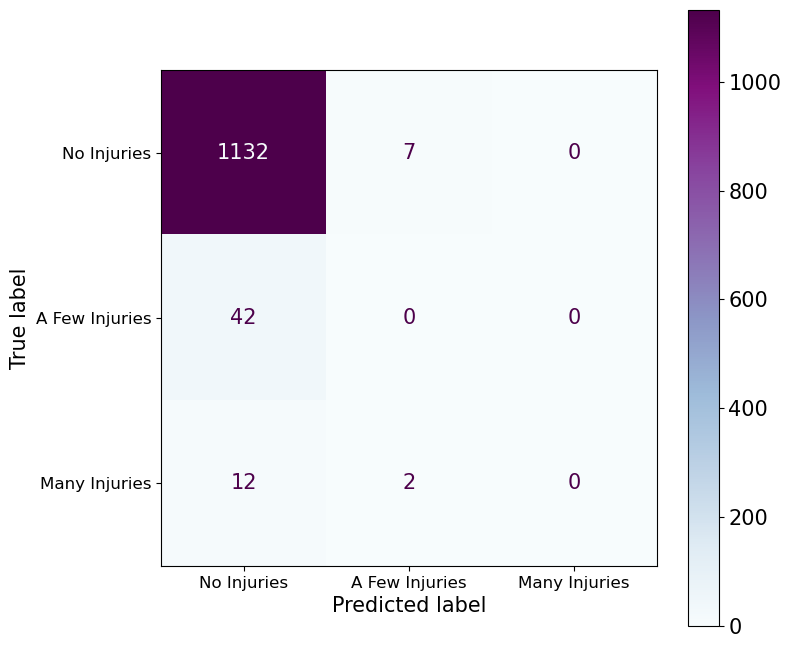

In [95]:
# Decision Tree
# Predictions on test set
y_pred = dt_model_cv.predict(test_X)

# Generate confusion matrix
cm = confusion_matrix(test_y, y_pred, labels = dt_model_cv.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = uniques)

# Specify figure size and font size
fig, ax = plt.subplots(figsize = (8, 8))
plt.rcParams.update({'font.size': 15})
plt.yticks(fontsize = 12) # fontsize of yticks
plt.xticks(fontsize = 12) # fontsize of xticks

# Display Confusion Matrix
disp.plot(cmap = 'BuPu', ax = ax);

fig.savefig("dt_class_matrix.png", bbox_inches='tight')

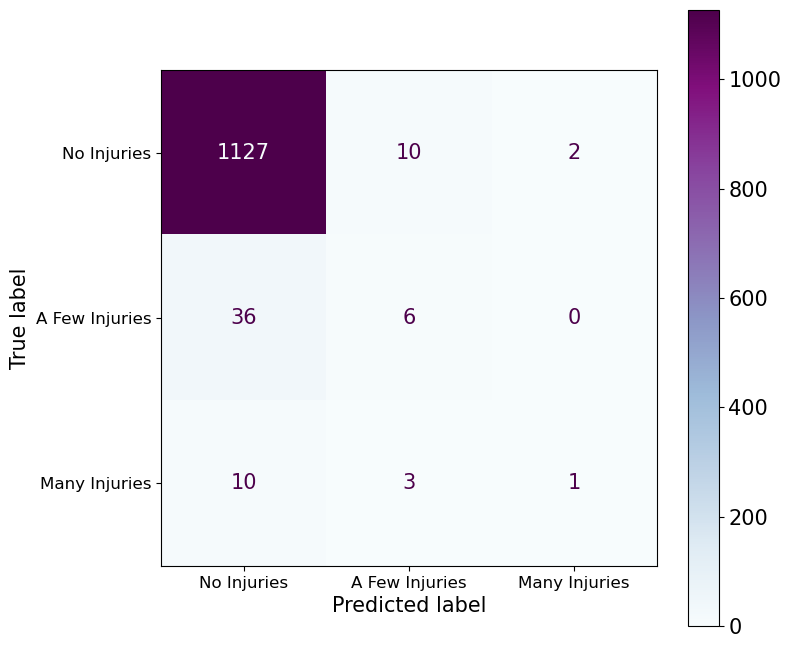

In [96]:
# XG Model
# Predictions on test set
y_pred = xg_model_cv.predict(test_X)

# Generate confusion matrix
cm = confusion_matrix(test_y, y_pred, labels = xg_model_cv.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = uniques)

# Specify figure size and font size
fig, ax = plt.subplots(figsize = (8, 8))
plt.rcParams.update({'font.size': 15})
plt.yticks(fontsize = 12) # fontsize of yticks
plt.xticks(fontsize = 12) # fontsize of xticks

# Display Confusion Matrix
disp.plot(cmap = 'BuPu', ax = ax);

fig.savefig("xg_class_matrix.png", bbox_inches='tight')

#### Classification Report

In [97]:
# XG Boost
# Generating Classification Report
report = classification_report(test_y, y_pred, output_dict = True, target_names = uniques)
report_df = pd.DataFrame(report)
report_df.to_csv('xg_class_report.csv')
report_df

,No Injuries,A Few Injuries,Many Injuries,accuracy,macro avg,weighted avg
precision,0.960784,0.315789,0.333333,0.948954,0.536636,0.930764
recall,0.989464,0.142857,0.071429,0.948954,0.401250,0.948954
f1-score,0.974913,0.196721,0.117647,0.948954,0.429761,0.937520
support,1139.000000,42.000000,14.000000,0.948954,1195.000000,1195.000000


In [98]:
# Decision Tree
# Generating Classification Report
y_pred = dt_model_cv.predict(test_X)
report = classification_report(test_y, y_pred, output_dict = True, target_names = uniques)
report_df = pd.DataFrame(report)
report_df.to_csv('dt_class_report.csv')
report_df

,No Injuries,A Few Injuries,Many Injuries,accuracy,macro avg,weighted avg
precision,0.954469,0.0,0.0,0.94728,0.318156,0.909741
recall,0.993854,0.0,0.0,0.94728,0.331285,0.947280
f1-score,0.973763,0.0,0.0,0.94728,0.324588,0.928131
support,1139.000000,42.0,14.0,0.94728,1195.000000,1195.000000


#### Feature Importance

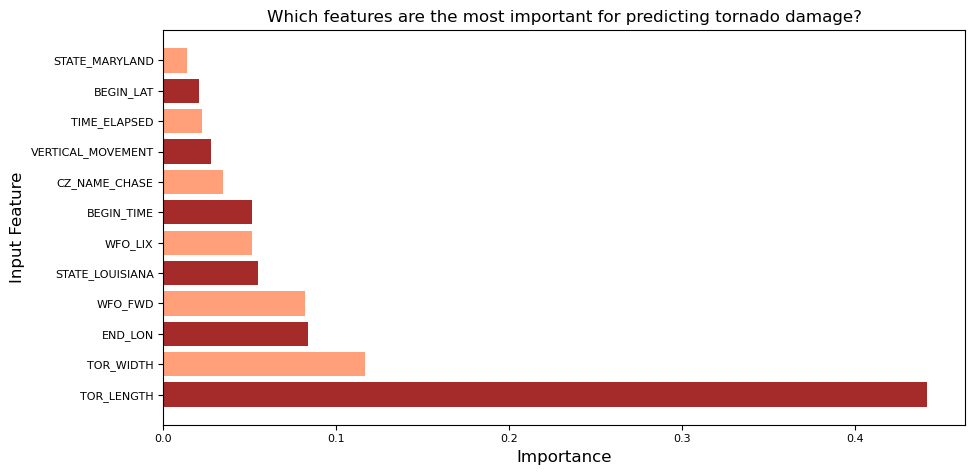

In [99]:
# Decision Tree Feature Importance
# Storing importance values from the trained model
importance = dt_model_cv.best_estimator_.feature_importances_

# Storing feature importance as a dataframe
feature_imp = pd.DataFrame(list(zip(train_X.columns, importance)),
               columns = ['Feature', 'Importance'])
feature_imp = feature_imp.sort_values('Importance', ascending = False).reset_index(drop = True)

# Selecting features with non-zero importance values
feature_imp_nonzero = feature_imp[feature_imp['Importance'] > 0.001]

# Bar plot
fig = plt.figure(figsize=(10, 5))
plt.barh(feature_imp_nonzero['Feature'], feature_imp_nonzero['Importance'], color = ['brown', 'lightsalmon'])

plt.xlabel("Importance", fontsize = 12)
plt.ylabel("Input Feature", fontsize = 12)
plt.title('Which features are the most important for predicting tornado damage?', fontsize = 12)
plt.yticks(fontsize = 8) # fontsize of yticks
plt.xticks(fontsize = 8) # fontsize of xticks

plt.tight_layout();

fig.savefig("dt_feature_imp.png", bbox_inches='tight')

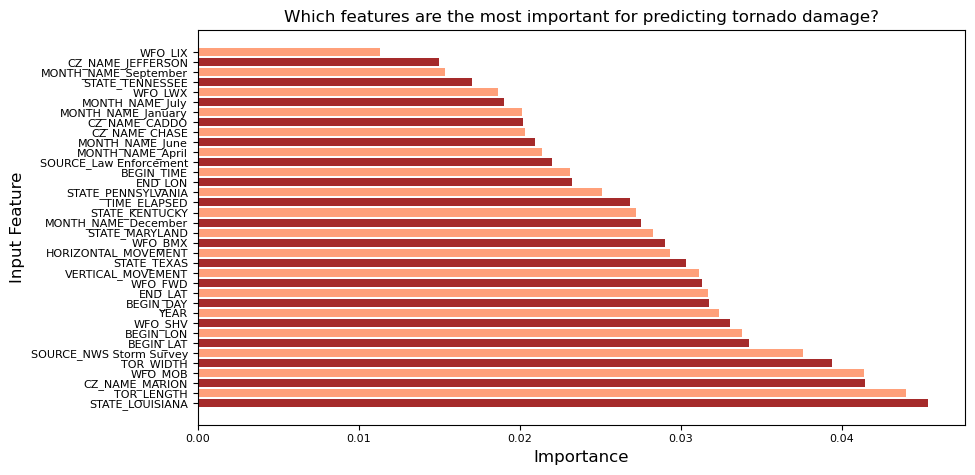

In [100]:
# XG Boost Feature Importance
# Storing importance values from the trained model
importance = xg_model_cv.best_estimator_.feature_importances_

# Storing feature importance as a dataframe
feature_imp = pd.DataFrame(list(zip(train_X.columns, importance)),
               columns = ['Feature', 'Importance'])
feature_imp = feature_imp.sort_values('Importance', ascending = False).reset_index(drop = True)

# Selecting features with non-zero importance values
feature_imp_nonzero = feature_imp[feature_imp['Importance'] > 0.001]

# Bar plot
fig = plt.figure(figsize=(10, 5))
plt.barh(feature_imp_nonzero['Feature'], feature_imp_nonzero['Importance'], color = ['brown', 'lightsalmon'])

plt.xlabel("Importance", fontsize = 12)
plt.ylabel("Input Feature", fontsize = 12)
plt.title('Which features are the most important for predicting tornado damage?', fontsize = 12)
plt.yticks(fontsize = 8) # fontsize of yticks
plt.xticks(fontsize = 8) # fontsize of xticks

plt.tight_layout();

fig.savefig("xg_feature_imp.png", bbox_inches='tight')

## Pickling Files

In [101]:
# Pickling the XG model
# Creating the file where we want to write the model
xg_pickle = open('xg_tornados.pickle', 'wb')

# Write XT model to the file
pickle.dump(bestXG, xg_pickle)

# Close the file
xg_pickle.close()

In [102]:
# Pickling the DT model
# Creating the file where we want to write the model
dt_pickle = open('dt_tornados.pickle', 'wb')

# Write DT model to the file
pickle.dump(bestDT, dt_pickle)

# Close the file
dt_pickle.close()

In [103]:
# Picling the uniques mapping
output_pickle = open('output_tornados.pickle', 'wb')
pickle.dump(uniques, output_pickle)
output_pickle.close()
